In [376]:
from src.preprocessing_modules import *
from src.preprocessing_2 import *
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
import umap
import pymde
import torch
import seaborn as sns
sns.set_theme(style='white')
import plotly.express as px
from sklearn.decomposition import PCA

In [371]:
# Set the random seed
tf.random.set_seed(0)
tf.keras.utils.set_random_seed(0)   
tf.config.experimental.enable_op_determinism()

In [372]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# GSE128639
PBMC CITE-seq with 25 antibodies describe in ADT

In [302]:
data_directory = 'Sample Datasets/GSE128639'
metadata, pro, rna, cite_data = load_data(data_directory)
GSE128639_obj = Rdata()

Reading Data in Sample Datasets/GSE128639/

Found protein, meta, rna data!


In [ ]:
#### CITE-seq with Deep-N-Omics ####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSE128639_test','gene_pro', epochs=20, override = True)
GSE128639_GP = makeObj([rna, pro],bottleneck, metadata,"celltype.l2")
GSE128639_obj.gene_protein = GSE128639_GP
#### RNA-seq with AE ###############
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSE128639_test', 'gene_only',epochs=20, override = True)
GSE128639_GO = makeObj(rna, bottleneck, metadata, "celltype.l2")
GSE128639_obj.gene_only = GSE128639_GO
#### CITE-seq with PCA ###############
GSE128639_PCA = PCAobj(cite_data, metadata, "celltype.l2")
GSE128639_obj.cite_pca = GSE128639_PCA
#### Control ##########################
GSE128639_control = makeObj(cite_data, None, metadata,"celltype.l2")
GSE128639_obj.control = GSE128639_control

#### Plot All

gene_protein 0.9103742827334377
gene_only 0.737121804903495
cite_pca 0.6674165362545644
control 0.26874673969744395


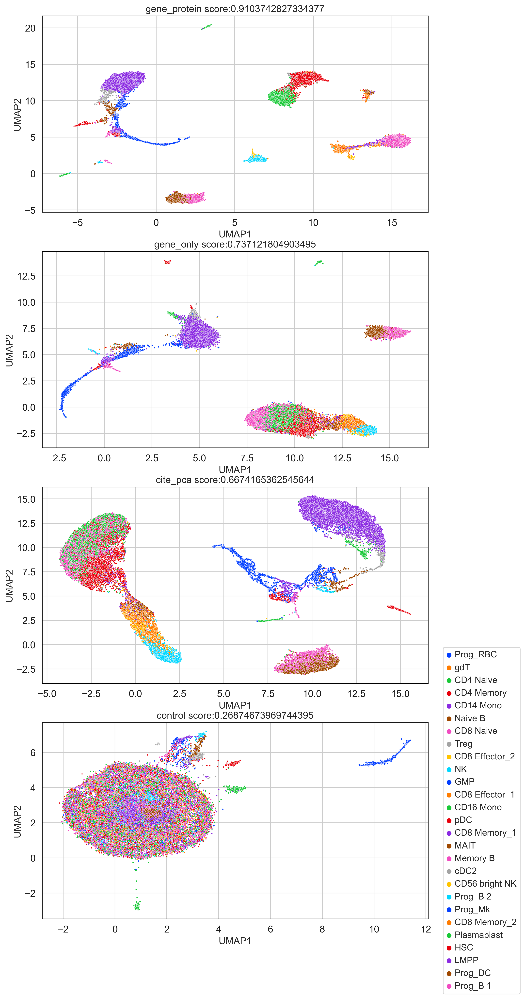

In [357]:
plotObjs(GSE128639_obj, metadata, "celltype.l2")

# GSE100866
CBMC CITE-seq with 13 antibodies describe in ADT.
We will use this as a example of manual data loading

In [358]:
# User specify dataset (each column is a gene/metadata feature and each row is a cell)
rna = pd.read_csv("Sample Datasets/GSE100866/rna_scale.csv.gz",index_col=0).T
pro = pd.read_csv("Sample Datasets/GSE100866/protein_scale.csv.gz", index_col=0).T
metadata = pd.read_csv("Sample Datasets/GSE100866/metadata.csv.gz",index_col=0)
metadata['cell_barcode'] = metadata.index # to preserve cell barcode

In [359]:
# remove multiplets TT because i forgot to in preprocessing
multiplets = list(metadata[metadata.rna_annotations == "Multiplets"].index)
rna = rna[~rna.index.isin(multiplets)]
pro = pro[~pro.index.isin(multiplets)]
metadata = metadata[~metadata.index.isin(multiplets)]

In [360]:
cite_data = pd.concat([rna, pro], axis = 1)
obj = Rdata()

#### CITE-seq with Deep-N-Omics

In [361]:
# run model 
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSE100866_test','gene_pro', epochs=20, override = True)
GSE100866_GP = makeObj([rna, pro],bottleneck, metadata,"rna_annotations")
obj.gene_protein = GSE100866_GP

Epoch 1/20
247/247 [==============================] - 5s 13ms/step - loss: 1.7547 - gene_decoder_last_loss: 0.6991 - protein_decoder_last_loss: 1.0556 - val_loss: 1.6812 - val_gene_decoder_last_loss: 0.6419 - val_protein_decoder_last_loss: 1.0393
Epoch 2/20
247/247 [==============================] - 3s 11ms/step - loss: 1.5054 - gene_decoder_last_loss: 0.6006 - protein_decoder_last_loss: 0.9049 - val_loss: 1.4504 - val_gene_decoder_last_loss: 0.6065 - val_protein_decoder_last_loss: 0.8438
Epoch 3/20
247/247 [==============================] - 3s 12ms/step - loss: 1.3925 - gene_decoder_last_loss: 0.5907 - protein_decoder_last_loss: 0.8018 - val_loss: 1.3374 - val_gene_decoder_last_loss: 0.5851 - val_protein_decoder_last_loss: 0.7523
Epoch 4/20
247/247 [==============================] - 3s 13ms/step - loss: 1.3283 - gene_decoder_last_loss: 0.5845 - protein_decoder_last_loss: 0.7437 - val_loss: 1.2946 - val_gene_decoder_last_loss: 0.5786 - val_protein_decoder_last_loss: 0.7161
Epoch 5/20
2

INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_merged/assets


INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_merged/assets


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
247/247 [==============================] - 1s 2ms/step


/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Epoch 1/20
247/247 [==============================] - 4s 11ms/step - loss: 0.7018 - val_loss: 0.6346
Epoch 2/20
247/247 [==============================] - 2s 9ms/step - loss: 0.6086 - val_loss: 0.5998
Epoch 3/20
247/247 [==============================] - 2s 9ms/step - loss: 0.5953 - val_loss: 0.5895
Epoch 4/20
247/247 [==============================] - 3s 11ms/step - loss: 0.5900 - val_loss: 0.5846
Epoch 5/20
247/247 [==============================] - 3s 12ms/step - loss: 0.5860 - val_loss: 0.5812
Epoch 6/20
247/247 [==============================] - 3s 13ms/step - loss: 0.5828 - val_loss: 0.5765
Epoch 7/20
247/247 [==============================] - 3s 11ms/step - loss: 0.5790 - val_loss: 0.5739
Epoch 8/20
247/247 [==============================] - 2s 10ms/step - loss: 0.5759 - val_loss: 0.5700
Epoch 9/20
247/247 [==============================] - 3s 11ms/step - loss: 0.5731 - val_loss: 0.5673
Epoch 10/20
247/247 [==============================] - 3s 11ms/step - loss: 0.5708 - val_loss

INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_encoder/assets


INFO:tensorflow:Assets written to: saved_models/GSE100866_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_encoder/assets


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
247/247 [==============================] - 1s 2ms/step


/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/ting/opt/anac

gene_protein 0.7967067764407854
gene_only 0.7963267891070298
cite_pca 0.8444585180493983
control 0.668777707409753


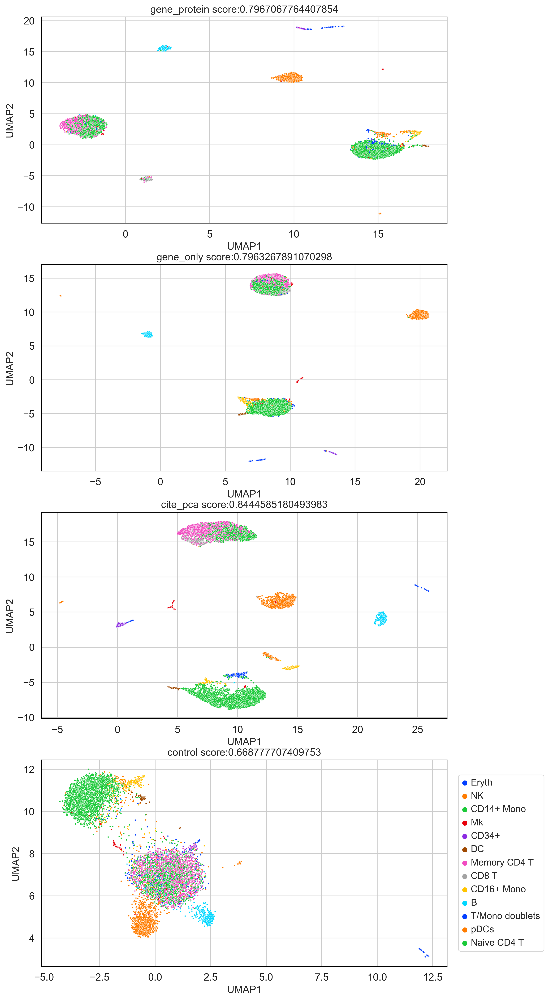

In [363]:
#### RNA-seq with AE
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSE100866_test', 'gene_only',epochs=20, override = True)
GSE100866_GO = makeObj(rna, bottleneck, metadata, "rna_annotations")
obj.gene_only = GSE100866_GO

#### CITE-seq with PCA
GSE100866_PCA = PCAobj(cite_data, metadata, "rna_annotations")
obj.cite_pca = GSE100866_PCA

#### Control
GSE100866_control = makeObj(cite_data, None, metadata,"rna_annotations" )
obj.control = GSE100866_control

#### Plot All
plotObjs(obj, metadata, "rna_annotations")

gene_protein 0.7967067764407854
gene_only 0.7963267891070298
cite_pca 0.8444585180493983
control 0.668777707409753


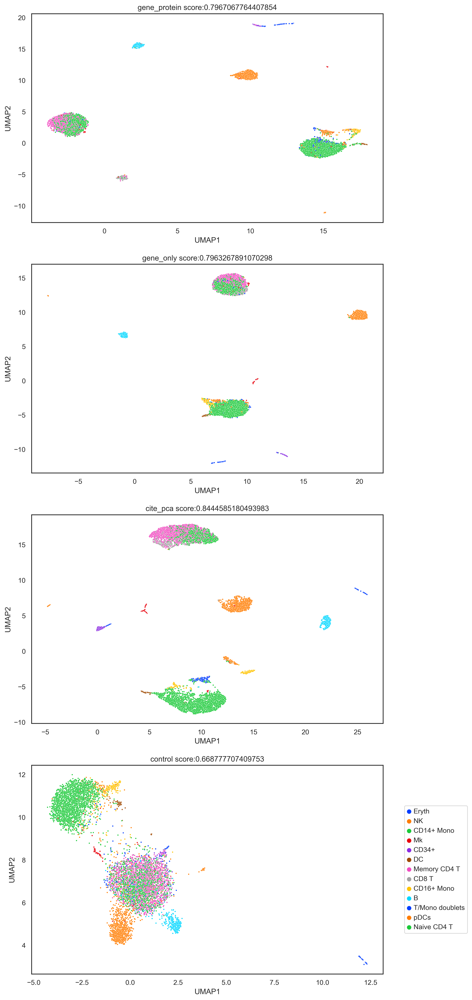

In [368]:
#### Plot All
plotObjs(obj, metadata, "rna_annotations")

### GSE164378

In [ ]:
# data missing 
data_directory = 'Sample Datasets/GSE164378'
metadata, pro, rna, cite_data = load_data(data_directory)
obj = Rdata()
# 'celltype.l1'
#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSE164378_test','gene_pro', epochs=20, override = True)
GSE100866_GP = makeObj([rna, pro],bottleneck, metadata,"rna_annotations")
obj.gene_protein = GSE100866_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSE164378_test', 'gene_only',epochs=20, override = True)
GSE100866_GO = makeObj(rna, bottleneck, metadata, "rna_annotations")
obj.gene_only = GSE100866_GO
#### CITE-seq with PCA #####
GSE100866_PCA = PCAobj(cite_data, metadata, "rna_annotations")
obj.cite_pca = GSE100866_PCA
#### Control #####
GSE100866_control = makeObj(cite_data, None, metadata,"rna_annotations" )
obj.control = GSE100866_control


In [ ]:
#### Plot All
plotObjs(obj, metadata, "rna_annotations")

# GSE153056

In [377]:
data_directory = 'Sample Datasets/GSE153056'
metadata, pro, rna, cite_data = load_data(data_directory)
GSE153056_obj = Rdata()
colRef = "Phase"

#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSE153056_test','gene_pro', epochs=20, override = False)
GSE153056_GP = makeObj([rna, pro],bottleneck, metadata,colRef)
GSE153056_obj.gene_protein = GSE153056_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSE153056_test', 'gene_only',epochs=20, override = False)
GSE153056_GO = makeObj(rna, bottleneck, metadata, colRef)
GSE153056_obj.gene_only = GSE153056_GO
#### CITE-seq with PCA #####
GSE153056_PCA = PCAobj(cite_data, metadata, colRef)
GSE153056_obj.cite_pca = GSE153056_PCA
#### Control #####
GSE153056_control = makeObj(cite_data, None, metadata,colRef )
GSE153056_obj.control = GSE153056_control

Reading Data in Sample Datasets/GSE153056/

Found protein, meta, rna data!
MODEL ALREADY EXISTS, TO RETRAIN, SET PARAM "override = True"
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
648/648 [==============================] - 2s 2ms/step
MODEL ALREADY EXISTS, TO RETRAIN, SET PARAM "override = True"
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
648/648 [==============================] - 2s 2ms/step


gene_protein 0.9262868445173429
gene_only 0.942110087317285
cite_pca 0.9514689565343238
control 0.9168797337064016


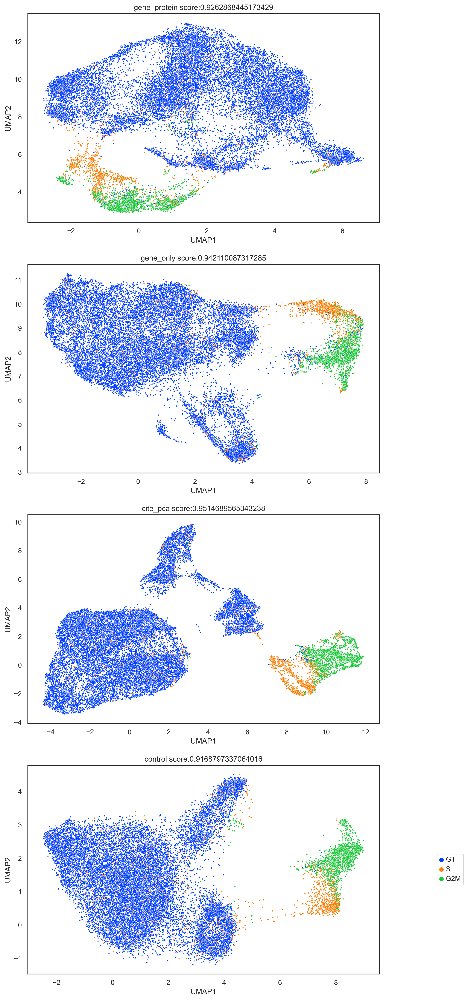

In [378]:
#### Plot All
plotObjs(GSE153056_obj, metadata, "Phase")

# GSE166489

In [379]:
### Severe
data_directory = 'Sample Datasets/GSE166489/MIS-C Severe/GSM5073055'
metadata, pro, rna, cite_data = load_data(data_directory)
GSM5073055_obj = Rdata()
colRef = 'predicted.celltype.l2'

#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSM5073055_test','gene_pro', epochs=20, override = True)
GSM5073055_GP = makeObj([rna, pro],bottleneck, metadata,colRef)
GSM5073055_obj.gene_protein = GSM5073055_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSM5073055_test', 'gene_only',epochs=20, override = True)
GSM5073055_GO = makeObj(rna, bottleneck, metadata, colRef)
GSM5073055_obj.gene_only = GSM5073055_GO
#### CITE-seq with PCA #####
GSM5073055_PCA = PCAobj(cite_data, metadata, colRef)
GSM5073055_obj.cite_pca = GSM5073055_PCA
#### Control #####
GSM5073055_control = makeObj(cite_data, None, metadata,colRef )
GSM5073055_obj.control = GSM5073055_control

Reading Data in Sample Datasets/GSE166489/MIS-C Severe/GSM5073055/

Found protein, meta, rna data!
Epoch 1/20
293/293 [==============================] - 5s 13ms/step - loss: 1.7622 - gene_decoder_last_loss: 0.7393 - protein_decoder_last_loss: 1.0229 - val_loss: 1.6732 - val_gene_decoder_last_loss: 0.7248 - val_protein_decoder_last_loss: 0.9484
Epoch 2/20
293/293 [==============================] - 3s 11ms/step - loss: 1.5057 - gene_decoder_last_loss: 0.6538 - protein_decoder_last_loss: 0.8519 - val_loss: 1.4863 - val_gene_decoder_last_loss: 0.6501 - val_protein_decoder_last_loss: 0.8362
Epoch 3/20
293/293 [==============================] - 3s 12ms/step - loss: 1.4741 - gene_decoder_last_loss: 0.6482 - protein_decoder_last_loss: 0.8260 - val_loss: 1.4548 - val_gene_decoder_last_loss: 0.6421 - val_protein_decoder_last_loss: 0.8127
Epoch 4/20
293/293 [==============================] - 3s 12ms/step - loss: 1.4560 - gene_decoder_last_loss: 0.6441 - protein_decoder_last_loss: 0.8119 - val_los

INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_merged/assets


INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_pro_NHG2_NHP1_DIV4_EPOCHS20_EncodingDim64_merged/assets


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
293/293 [==============================] - 1s 2ms/step


/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Epoch 1/20
293/293 [==============================] - 5s 14ms/step - loss: 0.7395 - val_loss: 0.6929
Epoch 2/20
293/293 [==============================] - 3s 12ms/step - loss: 0.6543 - val_loss: 0.6469
Epoch 3/20
293/293 [==============================] - 4s 13ms/step - loss: 0.6463 - val_loss: 0.6402
Epoch 4/20
293/293 [==============================] - 4s 13ms/step - loss: 0.6397 - val_loss: 0.6321
Epoch 5/20
293/293 [==============================] - 4s 12ms/step - loss: 0.6346 - val_loss: 0.6267
Epoch 6/20
293/293 [==============================] - 4s 12ms/step - loss: 0.6300 - val_loss: 0.6229
Epoch 7/20
293/293 [==============================] - 4s 13ms/step - loss: 0.6260 - val_loss: 0.6209
Epoch 8/20
293/293 [==============================] - 4s 15ms/step - loss: 0.6221 - val_loss: 0.6155
Epoch 9/20
293/293 [==============================] - 4s 13ms/step - loss: 0.6188 - val_loss: 0.6133
Epoch 10/20
293/293 [==============================] - 4s 12ms/step - loss: 0.6160 - val_lo

INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_auto/assets


INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_encoder/assets


INFO:tensorflow:Assets written to: saved_models/GSM5073055_test/gene_only_NHL2_DIV4_EPOCHS20_EncodingDim64_encoder/assets


You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
293/293 [==============================] - 1s 2ms/step


/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/ting/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/ting/opt/anac

gene_protein 0.8593066666666667
gene_only 0.8736
cite_pca 0.8801066666666667
control 0.6353066666666667


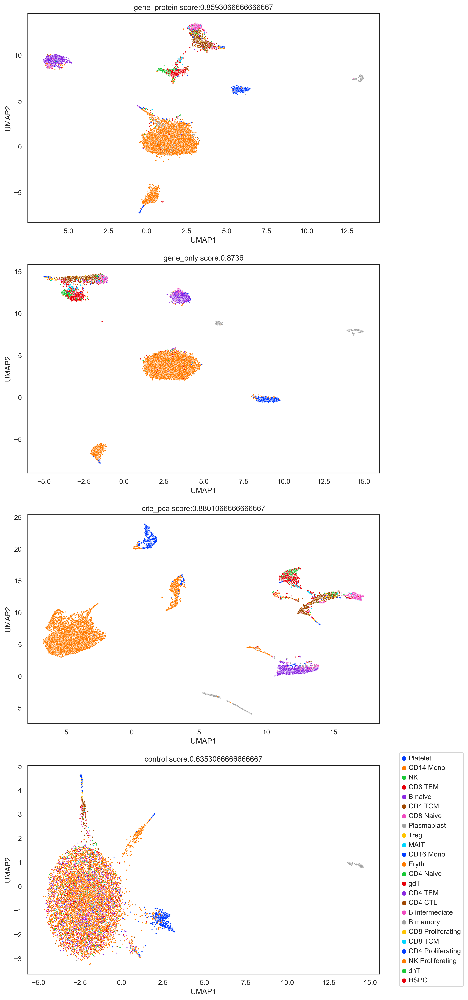

In [380]:
#### Plot All
plotObjs(GSM5073055_obj, metadata, 'predicted.celltype.l2')

In [ ]:
### Normal
data_directory = 'Sample Datasets/GSE166489/Normal/GSM5073070'
metadata, pro, rna, cite_data = load_data(data_directory)
GSM5073070_obj = Rdata()
colRef = 'predicted.celltype.l2'

#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'GSM5073070_test','gene_pro', epochs=20, override = True)
GSM5073070_GP = makeObj([rna, pro],bottleneck, metadata,colRef)
GSM5073070_obj.gene_protein = GSM5073070_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'GSM5073070_test', 'gene_only',epochs=20, override = True)
GSM5073070_GO = makeObj(rna, bottleneck, metadata, colRef)
GSM5073070_obj.gene_only = GSM5073070_GO
#### CITE-seq with PCA #####
GSM5073070_PCA = PCAobj(cite_data, metadata, colRef)
GSM5073070_obj.cite_pca = GSM5073070_PCA
#### Control #####
GSM5073070_control = makeObj(cite_data, None, metadata,colRef )
GSM5073070_obj.control = GSM5073070_control

Reading Data in Sample Datasets/GSE166489/Normal/GSM5073070/

Found protein, meta, rna data!
Epoch 1/20
276/276 [==============================] - 5s 14ms/step - loss: 1.7208 - gene_decoder_last_loss: 0.6988 - protein_decoder_last_loss: 1.0219 - val_loss: 1.6151 - val_gene_decoder_last_loss: 0.6626 - val_protein_decoder_last_loss: 0.9525
Epoch 2/20
276/276 [==============================] - 3s 12ms/step - loss: 1.4688 - gene_decoder_last_loss: 0.6164 - protein_decoder_last_loss: 0.8523 - val_loss: 1.4410 - val_gene_decoder_last_loss: 0.6058 - val_protein_decoder_last_loss: 0.8353
Epoch 3/20
276/276 [==============================] - 3s 12ms/step - loss: 1.4220 - gene_decoder_last_loss: 0.5986 - protein_decoder_last_loss: 0.8234 - val_loss: 1.4033 - val_gene_decoder_last_loss: 0.5926 - val_protein_decoder_last_loss: 0.8106
Epoch 4/20
276/276 [==============================] - 4s 13ms/step - loss: 1.4033 - gene_decoder_last_loss: 0.5931 - protein_decoder_last_loss: 0.8103 - val_loss: 1.3

In [ ]:
#### Plot All
plotObjs(GSM5073070_obj, metadata, 'predicted.celltype.l2')

# Kotliarov et al., 2020

In [ ]:
## Low Responders
data_directory = 'Sample Datasets/Kotliarov_2020/low_responders'
metadata, pro, rna, cite_data = load_data(data_directory)
KotliarovLow_obj = Rdata()
colRef = 'celltype'

#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'KotliarovLow_test','gene_pro', epochs=20, override = True)
KotliarovLow_GP = makeObj([rna, pro],bottleneck, metadata,colRef)
KotliarovLow_obj.gene_protein = KotliarovLow_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'KotliarovLow_test', 'gene_only',epochs=20, override = True)
KotliarovLow_GO = makeObj(rna, bottleneck, metadata, colRef)
KotliarovLow_obj.gene_only = KotliarovLow_GO
#### CITE-seq with PCA #####
KotliarovLow_PCA = PCAobj(cite_data, metadata, colRef)
KotliarovLow_obj.cite_pca = KotliarovLow_PCA
#### Control #####
KotliarovLow_control = makeObj(cite_data, None, metadata,colRef )
KotliarovLow_obj.control = KotliarovLow_control

In [ ]:
#### Plot All
plotObjs(KotliarovLow_obj, metadata, 'celltype')

In [ ]:
## High Responders
data_directory = 'Sample Datasets/Kotliarov_2020/high_responders'
metadata, pro, rna, cite_data = load_data(data_directory)
KotliarovHigh_obj = Rdata()
colRef = 'celltype'

#### CITE-seq with AE #####
GPhistory, GPautodecoder, bottleneck = gene_protein_encoder(pro, rna, pro, rna, 64, 'KotliarovHigh_test','gene_pro', epochs=20, override = True)
KotliarovHigh_GP = makeObj([rna, pro],bottleneck, metadata,colRef)
KotliarovHigh_obj.gene_protein = KotliarovHigh_GP
#### RNA-seq with AE #####
GOhistory, GOautoencoder, bottleneck = gene_only_encoder(rna, rna, 64, 'KotliarovHigh_test', 'gene_only',epochs=20, override = True)
KotliarovHigh_GO = makeObj(rna, bottleneck, metadata, colRef)
KotliarovHigh_obj.gene_only = KotliarovHigh_GO
#### CITE-seq with PCA #####
KotliarovHigh_PCA = PCAobj(cite_data, metadata, colRef)
KotliarovHigh_obj.cite_pca = KotliarovHigh_PCA
#### Control #####
KotliarovHigh_control = makeObj(cite_data, None, metadata,colRef )
KotliarovHigh_obj.control = KotliarovHigh_control

In [ ]:
#### Plot All
plotObjs(KotliarovHigh_obj, metadata, 'celltype')